# CNN

In [1]:
import tensorflow as tf
from keras import layers, models
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import itertools

c:\Users\usuario\Fer-Pc\Escritorio\EPN\2024-A\SEPTIMO_SEMESTRE\RECUPERACION_DE_INFORMACION\ir24a\venv3.8\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
(train_dataset, test_dataset), dataset_info = tfds.load(
    name='caltech101:3.0.2',
    split=['train[:80%]', 'test[20%:]'],
    with_info=True,
    as_supervised=True,
    data_dir='C:\\Users\\usuario\\Fer-Pc\\Escritorio\\EPN\\2024-A\\SEPTIMO_SEMESTRE\\RECUPERACION_DE_INFORMACION\\ir24a\\week14\\data',
    download= True,
)

In [3]:
num_classes = dataset_info.features['label'].num_classes

def preprocess_image(image, label):
    image = tf.image.resize(image, (224, 224))
    image = tf.cast(image, tf.float32) / 255.0
    return image, label

train_dataset = train_dataset.map(preprocess_image).shuffle(1000).batch(32)
test_dataset = test_dataset.map(preprocess_image).batch(32)

In [4]:
model = models.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(224, 224, 3)),
    layers.MaxPooling2D((2, 2)),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.MaxPooling2D((2, 2)),
    layers.Flatten(),
    layers.Dense(128, activation='relu'),
    layers.Dense(num_classes, activation='softmax')
])

In [5]:
model.compile(optimizer='adam',
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

model.fit(train_dataset, epochs=10, validation_data=test_dataset)

Epoch 1/10
77/77 [==============================] - 78s 1s/step - loss: 4.6608 - accuracy: 0.0364 - val_loss: 4.4419 - val_accuracy: 0.0816
Epoch 2/10
77/77 [==============================] - 209s 3s/step - loss: 3.4559 - accuracy: 0.2640 - val_loss: 3.1398 - val_accuracy: 0.3700
Epoch 3/10
77/77 [==============================] - 209s 3s/step - loss: 1.0581 - accuracy: 0.7781 - val_loss: 4.0251 - val_accuracy: 0.3811
Epoch 4/10
77/77 [==============================] - 210s 3s/step - loss: 0.2060 - accuracy: 0.9665 - val_loss: 4.6044 - val_accuracy: 0.3743
Epoch 5/10
77/77 [==============================] - 217s 3s/step - loss: 0.0457 - accuracy: 0.9935 - val_loss: 4.6505 - val_accuracy: 0.3864
Epoch 6/10
77/77 [==============================] - 208s 3s/step - loss: 0.0130 - accuracy: 0.9980 - val_loss: 4.9786 - val_accuracy: 0.4008
Epoch 7/10
77/77 [==============================] - 214s 3s/step - loss: 0.0021 - accuracy: 1.0000 - val_loss: 5.2939 - val_accuracy: 0.4002
Epoch 8/10
77/

In [6]:
num_params = model.count_params()
print(f"Number of trainable parameters in the model: {num_params}")

Number of trainable parameters in the model: 23920550


1/1 [==============================] - 0s 88ms/step


ValueError: num must be an integer with 1 <= num <= 25, not 26

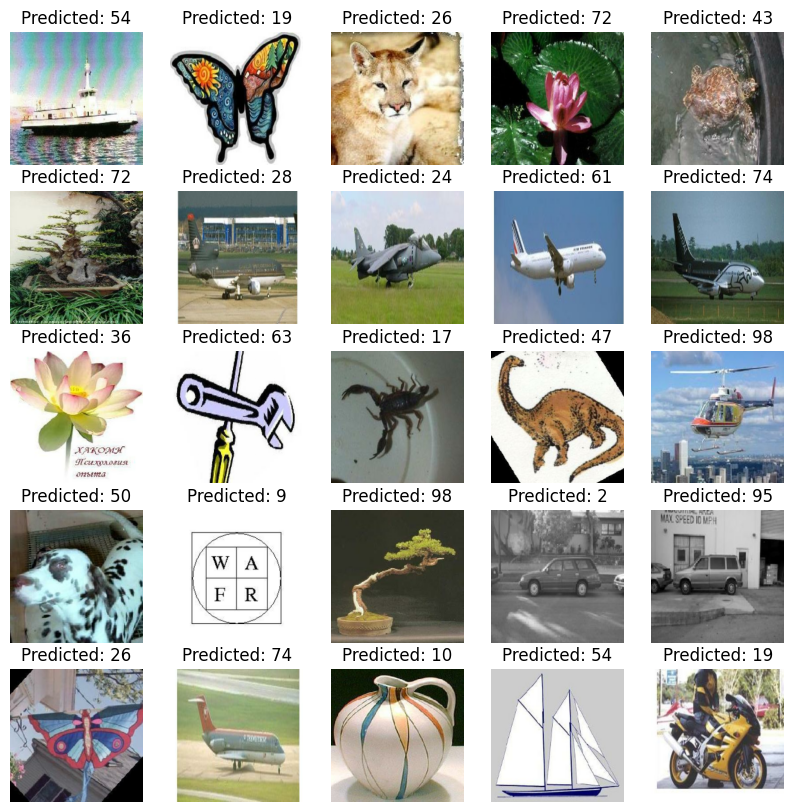

In [7]:
misclassified_images = []
misclassified_labels = []
for image, label in test_dataset:
    predictions = model.predict(image)
    predicted_label = np.argmax(predictions, axis=1)
    misclassified_idx = np.where(predicted_label != label.numpy())[0]
    for idx in misclassified_idx:
        misclassified_images.append(image[idx])
        misclassified_labels.append(predicted_label[idx])

plt.figure(figsize=(10, 10))
for i in range(len(misclassified_images)):
    plt.subplot(5, 5, i+1)
    plt.imshow(misclassified_images[i])
    plt.title(f"Predicted: {misclassified_labels[i]}")
    plt.axis('off')
plt.show()

1/1 [==============================] - 0s 49ms/step


ValueError: num must be an integer with 1 <= num <= 400, not 401

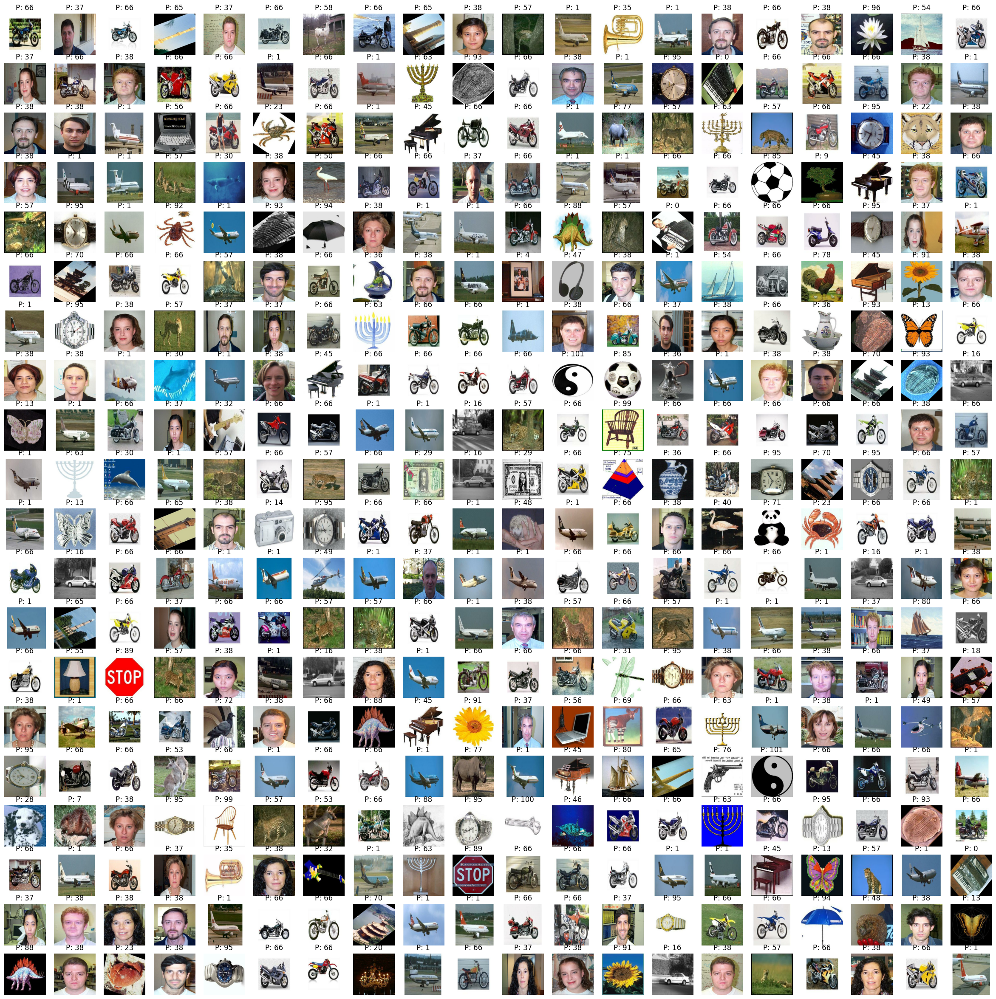

In [8]:
niceclassified_images = []
niceclassified_labels = []
for image, label in test_dataset:
    predictions = model.predict(image)
    predicted_label = np.argmax(predictions, axis=1)
    niceclassified_idx = np.where(predicted_label == label.numpy())[0]
    for idx in niceclassified_idx:
        niceclassified_images.append(image[idx])
        niceclassified_labels.append(predicted_label[idx])

plt.figure(figsize=(30, 30))
for i in range(len(niceclassified_images)):
    plt.subplot(20, 20, i+1)
    plt.imshow(niceclassified_images[i])
    plt.title(f"P: {niceclassified_labels[i]}")
    plt.axis('off')
plt.show()

In [9]:
sample_image, _ = next(itertools.islice(iter(test_dataset), 0, 1))

1/1 [==============================] - 0s 66ms/step


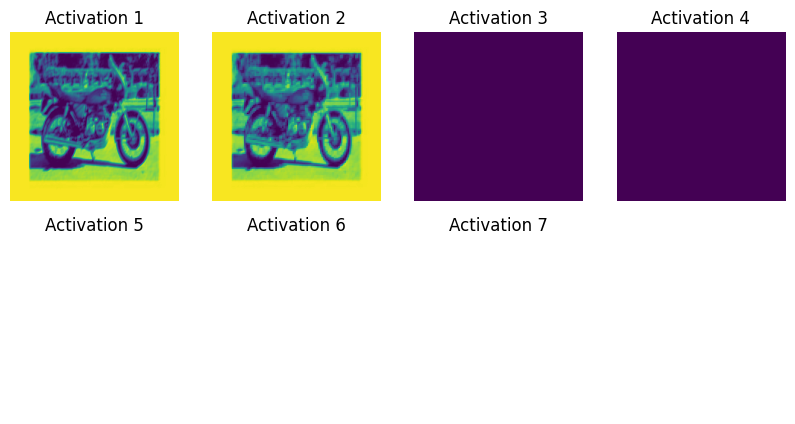

In [10]:
sample_image = sample_image[:1]

activation_model = models.Model(inputs=model.input,
                                outputs=[layer.output for layer in model.layers])
# activation_model = models.Model(inputs=model.input, outputs=model.layers[4].output)
activations = activation_model.predict(sample_image)

plt.figure(figsize=(10, 5))
for i, activation in enumerate(activations):
    plt.subplot(2, 4, i+1)
    try:
        plt.imshow(activation[0, :, :, 0], cmap='viridis')
    except:
        pass
    plt.title(f"Activation {i+1}")
    plt.axis('off')
plt.show()